# House Price Prediction

We are asked to predict price of any house in this city. With housing crisis in it's finest, we'd better find among the many many variables, good combination to predict: this is worth so much. 

Variables:
- SalePrice - the property's sale price in dollars. This is the target variable that you're trying to predict.
- MSSubClass: The building class 
- MSZoning: The general zoning classification
- LotFrontage: Linear feet of street connected to property
- LotArea: Lot size in square feet
- Street: Type of road access
- Alley: Type of alley access
- LotShape: General shape of property
- LandContour: Flatness of the property
- Utilities: Type of utilities available
- LotConfig: Lot configuration
- LandSlope: Slope of property
- Neighborhood: Physical locations within Ames city limits
- Condition1: Proximity to main road or railroad
- Condition2: Proximity to main road or railroad (if a second is present)
- BldgType: Type of dwelling
- HouseStyle: Style of dwelling
- OverallQual: Overall material and finish quality
- OverallCond: Overall condition rating
- YearBuilt: Original construction date
- YearRemodAdd: Remodel date
- RoofStyle: Type of roof
- RoofMatl: Roof material
- Exterior1st: Exterior covering on house
- Exterior2nd: Exterior covering on house (if more than one material)
- MasVnrType: Masonry veneer type
- MasVnrArea: Masonry veneer area in square feet
- ExterQual: Exterior material quality
- ExterCond: Present condition of the material on the exterior
- Foundation: Type of foundation
- BsmtQual: Height of the basement
- BsmtCond: General condition of the basement
- BsmtExposure: Walkout or garden level basement walls
- BsmtFinType1: Quality of basement finished area
- BsmtFinSF1: Type 1 finished square feet
- BsmtFinType2: Quality of second finished area (if present)
- BsmtFinSF2: Type 2 finished square feet
- BsmtUnfSF: Unfinished square feet of basement area
- TotalBsmtSF: Total square feet of basement area
- Heating: Type of heating
- HeatingQC: Heating quality and condition
- CentralAir: Central air conditioning
- Electrical: Electrical system
- 1stFlrSF: First Floor square feet
- 2ndFlrSF: Second floor square feet
- LowQualFinSF: Low quality finished square feet (all floors)
- GrLivArea: Above grade (ground) living area square feet
- BsmtFullBath: Basement full bathrooms
- BsmtHalfBath: Basement half bathrooms
- FullBath: Full bathrooms above grade
- HalfBath: Half baths above grade
- Bedroom: Number of bedrooms above basement level
- Kitchen: Number of kitchens
- KitchenQual: Kitchen quality
- TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)
- Functional: Home functionality rating
- Fireplaces: Number of fireplaces
- FireplaceQu: Fireplace quality
- GarageType: Garage location
- GarageYrBlt: Year garage was built
- GarageFinish: Interior finish of the garage
- GarageCars: Size of garage in car capacity
- GarageArea: Size of garage in square feet
- GarageQual: Garage quality
- GarageCond: Garage condition
- PavedDrive: Paved driveway
- WoodDeckSF: Wood deck area in square feet
- OpenPorchSF: Open porch area in square feet
- EnclosedPorch: Enclosed porch area in square feet
- 3SsnPorch: Three season porch area in square feet
- ScreenPorch: Screen porch area in square feet
- PoolArea: Pool area in square feet
- PoolQC: Pool quality
- Fence: Fence quality
- MiscFeature: Miscellaneous feature not covered in other categories
- MiscVal: \$Value of miscellaneous feature
- MoSold: Month Sold
- YrSold: Year Sold
- SaleType: Type of sale
- SaleCondition: Condition of sale




In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import FunctionTransformer, OrdinalEncoder, OneHotEncoder, StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split
from lightgbm import LGBMRegressor
from shap import TreeExplainer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer, r2_score
from sklearn.tree import DecisionTreeRegressor

## Load the dataset

In [2]:
dataset = pd.read_csv('train.csv', index_col= 'Id')
print(dataset.shape)

(1460, 80)


The data is composed of 80 columns and 1460 entries. We can see all 80 dimensions of our dataset by printing out the random 3 entries and show info about these variables using the following code:

In [3]:
dataset.sample(3)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,
1414,20,RL,88.0,10994,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,9,2009,COD,Abnorml,257000
1292,160,RM,21.0,1680,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2009,WD,Normal,119500
1171,80,RL,76.0,9880,Pave,NaN,Reg,Lvl,AllPub,Inside,...,576,Gd,GdPrv,NaN,0,7,2008,WD,Normal,171000


In [4]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1460 entries, 1 to 1460
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuilt    

Some numerical variables, some NaNs, some need preprocessing to become numerical. It's neccesary to procces the variables in the following steps.

In [5]:
y_train, X_train = dataset['SalePrice'], dataset.drop(['SalePrice'], axis = 1)

## Prepare the dataset

### House Price Distribution

Now let us take a look at how the house prices are distributed.

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64




`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



<Axes: xlabel='SalePrice', ylabel='Density'>

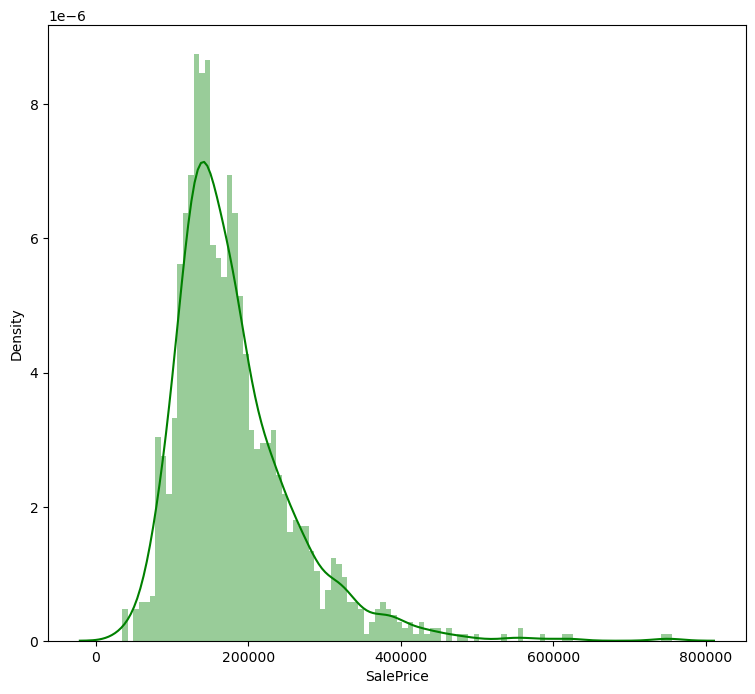

In [6]:
print(y_train.describe())
plt.figure(figsize=(9, 8))
sns.distplot(y_train, color='g', bins=100, hist_kws={'alpha': 0.4})

### Numerical data distribution

We will now take a look at how the numerical features are distributed. In order to do this, let us first list all the types of data from our dataset and select only the numerical ones.

In [7]:
list(set(X_train.dtypes.tolist()))

[dtype('float64'), dtype('O'), dtype('int64')]

In [8]:
df_num = X_train.select_dtypes(include = ['float64', 'int64'])
df_num.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
Id,,,,,,,,,,,,,,,,,,,,,
1,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,548,0,61,0,0,0,0,0,2,2008
2,20,80.0,9600,6,8,1976,1976,0.0,978,0,...,460,298,0,0,0,0,0,0,5,2007
3,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,608,0,42,0,0,0,0,0,9,2008
4,70,60.0,9550,7,5,1915,1970,0.0,216,0,...,642,0,35,272,0,0,0,0,2,2006
5,60,84.0,14260,8,5,2000,2000,350.0,655,0,...,836,192,84,0,0,0,0,0,12,2008


In [9]:
df_num.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0


We have some generous subset of 36 features that can be visualized via histograms, kde plots etc. As we can see in dataframe above, some variables have very interesting distributions. For example MiscValue has mean = 43.48, but the 1st quartile equal to 0.0. It means that the distribution is aggresively right-aysmetrical. Worth seeing it.

Now let us plot the distribution for all the numerical features.

array([[<Axes: title={'center': 'MSSubClass'}>,
        <Axes: title={'center': 'LotFrontage'}>,
        <Axes: title={'center': 'LotArea'}>,
        <Axes: title={'center': 'OverallQual'}>,
        <Axes: title={'center': 'OverallCond'}>,
        <Axes: title={'center': 'YearBuilt'}>],
       [<Axes: title={'center': 'YearRemodAdd'}>,
        <Axes: title={'center': 'MasVnrArea'}>,
        <Axes: title={'center': 'BsmtFinSF1'}>,
        <Axes: title={'center': 'BsmtFinSF2'}>,
        <Axes: title={'center': 'BsmtUnfSF'}>,
        <Axes: title={'center': 'TotalBsmtSF'}>],
       [<Axes: title={'center': '1stFlrSF'}>,
        <Axes: title={'center': '2ndFlrSF'}>,
        <Axes: title={'center': 'LowQualFinSF'}>,
        <Axes: title={'center': 'GrLivArea'}>,
        <Axes: title={'center': 'BsmtFullBath'}>,
        <Axes: title={'center': 'BsmtHalfBath'}>],
       [<Axes: title={'center': 'FullBath'}>,
        <Axes: title={'center': 'HalfBath'}>,
        <Axes: title={'center': 'Bedroo

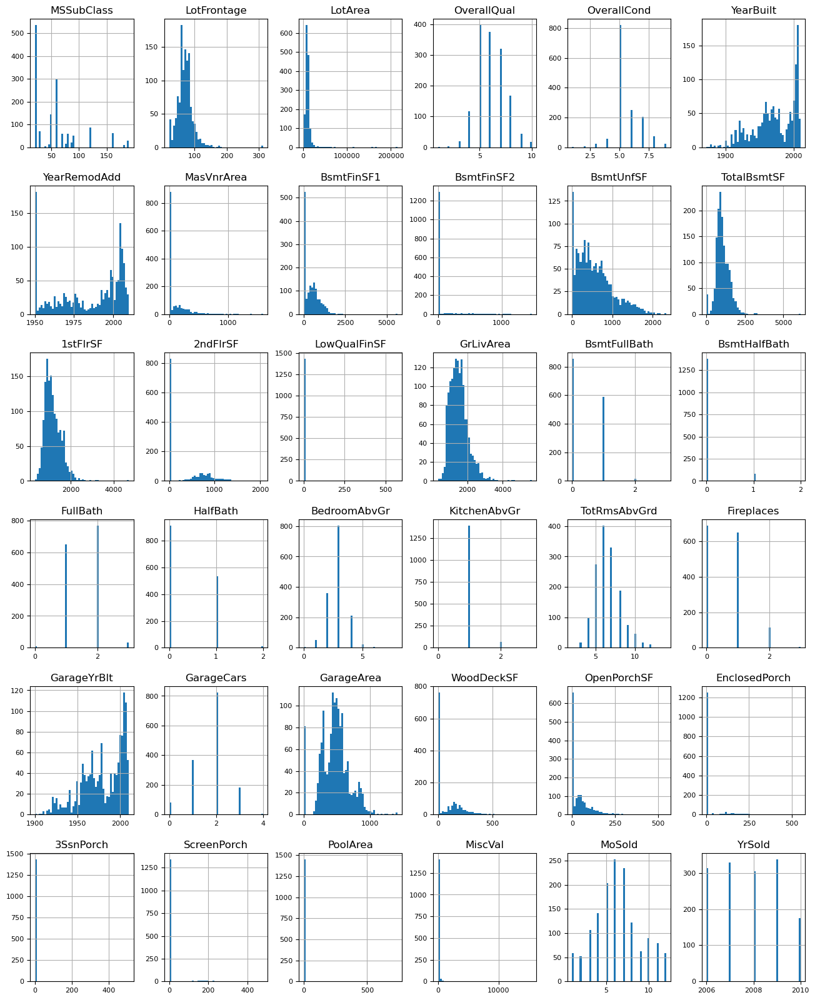

In [10]:
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)

What we can see is that indeed, there are many right-asymetrical (mean>median) distributions. For ex. PoolArea, MiscVal, Enclosed Porch and so forth. But there are more interesting distributions like left-asymetrical GarageYrBlt or YearBlt. We have mix of continous variables and discrete ones.
Ideas:
- for variables like EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea, MiscValue in face of such inbalance, it is more imporant if the property hase pool or not, this will discriminate greatly. Maybe we loose a bit of information but I think the simplicity of model is worth it. This situation will hold in every variable, where the 1st bin is almost the only visible class on the plot (LowQualFinSF, 3SsnPorch, ScreenPorch, PoolArea, MiscVal, EnclosedPorch, LotArea etc.)
- variables that have some visible distributions, we will perform normalization and try to make these symetrical. 

In summary: where the distribution is not visible (first class outnumbers greatly the others) we will one-hot enocode. Where there is some distribtion, we will normalize.

Let's try to split numeric from other columns.

In [11]:
num_cats = X_train.describe().T.index
other_cats = X_train.columns.difference(num_cats) #we substract the variables that can be described from all to focus on these that need more caution

In [12]:
num_to_hot_encode = pd.Index(['3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'LowQualFinSF', 'LotArea', 'BsmtFinSF2'])
num_to_normalize = num_cats.difference(num_to_hot_encode)

### Categorical Variables

We will visualize counts of variant of categorical variables to quickly differenciate: is our variable binary or nominal,

43


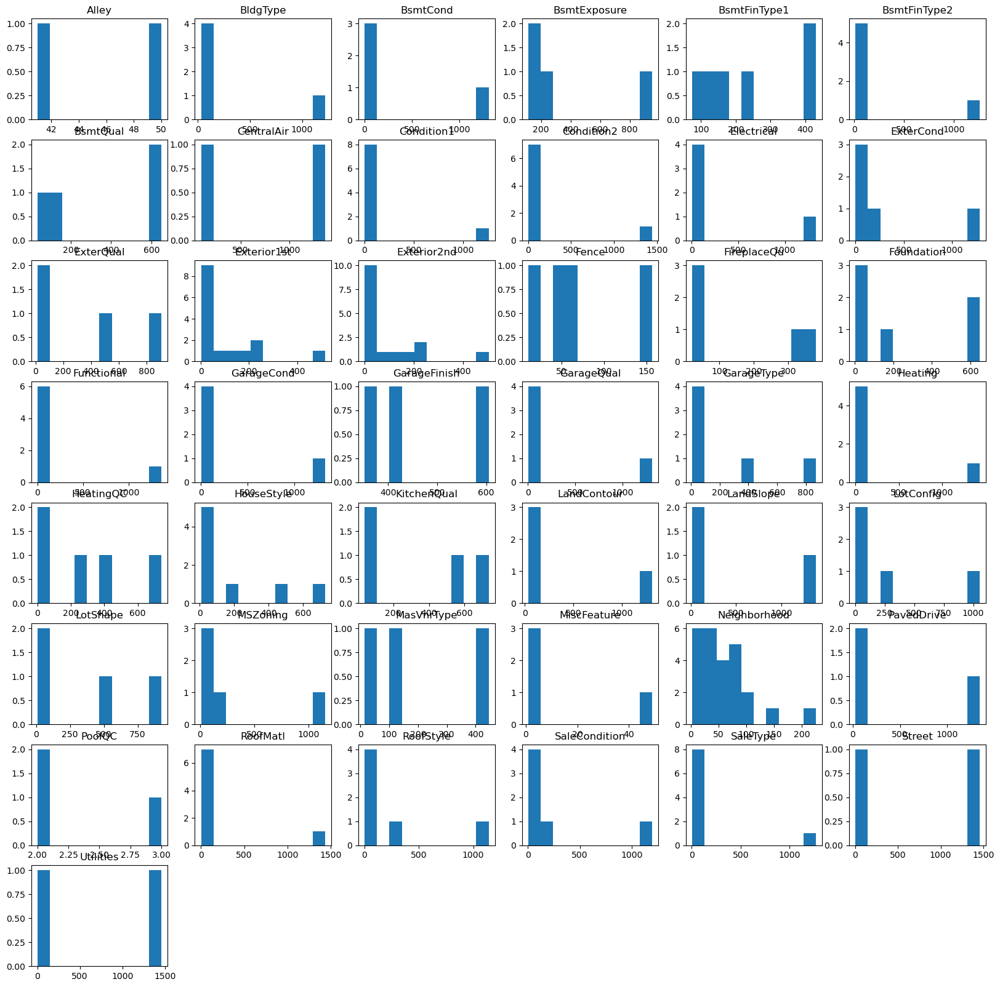

In [13]:
cat_variables = X_train.columns.difference(num_cats)
categorical_counts = []
for column in cat_variables:
    counts = X_train[column].value_counts()
    counts.name = column
    categorical_counts.append(counts)
print(len(categorical_counts))
fig = plt.figure(figsize=(20, 20))
for num, variable in enumerate(categorical_counts):
    ax = fig.add_subplot(len(categorical_counts)//6+1, 6, num+1)
    ax.hist(variable)
    ax.set_title(variable.name)# I want to have six plots in a row, so I calculate number of rows

Splitting the categorical variables into nominal (one-hot-encoding) and ordinal (ordinal-encoding). It was performed using the data_description.txt file.

In [14]:
cat_var_nominal = pd.Index(['Alley', 'BldgType', 'CentralAir', 'Electrical', 'Exterior1st',
'Exterior2nd',  'HouseStyle', 'MasVnrType', 'MiscFeature', 'Neighborhood',
'RoofMatl', 'RoofStyle', 'SaleCondition', 'SaleType', 'Street'])

cat_var_ordinal = pd.Index(['BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
'BsmtQual', 'Condition1', 'Condition2', 'ExterCond', 'ExterQual', 'Fence',
'FireplaceQu', 'Foundation', 'Functional', 'GarageCond', 'GarageFinish', 'GarageQual',
'GarageType', 'Heating', 'HeatingQC', 'KitchenQual', 'LandContour', 'LandSlope',
'LotConfig', 'LotShape', 'MSZoning', 'PavedDrive', 'PoolQC', 'Utilities'])



We have achieved four subsets of variables, each to be treated seperately (at least at the beggining). 
- numerical continous/discrete -> to be standarized/normalized [num_to_normalize]
- numerical quasi-binary -> to be encoded 1 if class>0 else 0 [num_to_hot_encode]
- categorical nominal -> OneHotEncoder [cat_var_nominal]
- categorical nominal -> OrdinalEncoder [cat_var_ordinal]

### Missing values

After splitting variables into correct types, we have to address elephant in the room: missing values. Let's analyze structure of missing values in our dataset.

In [15]:
missing_values_features = X_train.columns[np.mean(X_train.isna(), axis=0)>0] #columns where values are missing

In [16]:
np.mean(X_train.isna(), axis=0)[missing_values_features]

LotFrontage     0.177397
Alley           0.937671
MasVnrType      0.597260
MasVnrArea      0.005479
BsmtQual        0.025342
BsmtCond        0.025342
BsmtExposure    0.026027
BsmtFinType1    0.025342
BsmtFinType2    0.026027
Electrical      0.000685
FireplaceQu     0.472603
GarageType      0.055479
GarageYrBlt     0.055479
GarageFinish    0.055479
GarageQual      0.055479
GarageCond      0.055479
PoolQC          0.995205
Fence           0.807534
MiscFeature     0.963014
dtype: float64

As we can see there are several features that have almost 100% missing values. In that case, when 80% of values or more are missing, I will discard these features. I just don't know what happens in this population. I think the rest can be safely inputed using most common value in case of categorical, and mean in case of numerical values.

In [17]:
features_to_discard = X_train.columns[np.mean(X_train.isna(), axis=0)>0.8]

So now let's clean our dataset from features that lack simply too many values.

In [18]:
cat_var_nominal = cat_var_nominal.difference(features_to_discard)
cat_var_ordinal = cat_var_ordinal.difference(features_to_discard)
num_to_hot_encode = num_to_hot_encode.difference(features_to_discard)
num_to_normalize = num_to_normalize.difference(features_to_discard)

## Prepare the data to better expose the underlying data patterns to machine learning algorithms.

Now is the time to build some pipelines. Here is what we are going to do:
1. impute the data: categorical with most-frequent, numerical to normalizwe with mean, numerical to hot encode with median (due to skewness of distribution)
2. process every subset accordingly seperately

In [19]:
class PassthroughTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.function = lambda x: (x>0).astype('int')
        # Zainicjalizuj pustą listę nazw kolumn, które zostaną uzupełnione w fit
        self.feature_names_out_ = []

    def fit(self, X, y=None):
        # Przyjmujemy, że dostajesz DataFrame, więc możemy dostać nazwy kolumn
        if hasattr(X, 'columns'):
            self.feature_names_out_ = X.columns.tolist()
        else:
            # W przypadku Numpy Array, tworzymy zastępcze nazwy kolumn
            n_features = X.shape[1]
            self.feature_names_out_ = [f"feature_{i}" for i in range(n_features)]
        return self

    def transform(self, X):
        return self.function(X)

    def get_feature_names_out(self, input_features=None):
        return self.feature_names_out_  # Zwróć zapamiętane w fit() nazwy kolumn

    
# def if_level_higher_than_zero(X):
#     return (X>0).astype('int')

final_transformer = ColumnTransformer([
    ('cat_var_ordinal_trans', make_pipeline(SimpleImputer(strategy='most_frequent'), OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)), cat_var_ordinal),
    ('cat_var_nominal_trans', make_pipeline(SimpleImputer(strategy='most_frequent'), OneHotEncoder(handle_unknown='ignore')), cat_var_nominal),
    ('num_to_normalize_trans', make_pipeline(SimpleImputer(strategy='mean'), StandardScaler()), num_to_normalize),
    ('num_to_hot_encode_trans', make_pipeline(SimpleImputer(strategy='median'), PassthroughTransformer()), num_to_hot_encode)], remainder='drop')

In [20]:
X_train, X_test, y_train , y_test = train_test_split(X_train, y_train, test_size=0.15)

In [21]:
X_train_processed = pd.DataFrame(final_transformer.fit_transform(X_train), columns=final_transformer.get_feature_names_out())
X_test_processed = pd.DataFrame(final_transformer.transform(X_test), columns=final_transformer.get_feature_names_out())

In [22]:
pd.concat([X_train_processed, y_train], axis=1).corr()['SalePrice']

cat_var_ordinal_trans__BsmtCond        0.005713
cat_var_ordinal_trans__BsmtExposure    0.029554
cat_var_ordinal_trans__BsmtFinType1    0.026522
cat_var_ordinal_trans__BsmtFinType2    0.015219
cat_var_ordinal_trans__BsmtQual        0.007050
                                         ...   
num_to_hot_encode_trans__feature_3    -0.053140
num_to_hot_encode_trans__feature_4    -0.009985
num_to_hot_encode_trans__feature_5    -0.006193
num_to_hot_encode_trans__feature_6    -0.006848
SalePrice                              1.000000
Name: SalePrice, Length: 167, dtype: float64

## Explore many different models and shortlist the best ones.

In [23]:
def residuals(y_train_pred, y_test_pred, y_train, y_test):
    x_max = np.max(
        [np.max(y_train_pred), np.max(y_test_pred)])
    x_min = np.min(
        [np.min(y_train_pred), np.min(y_test_pred)])

    fig, (ax1, ax2) = plt.subplots(
        1, 2, figsize=(7, 3), sharey=True)


    ax1.scatter(
        y_test_pred, y_test_pred - y_test,
        c='limegreen', marker='s',
        edgecolor='white',
        label='Test data')

    ax2.scatter(
        y_train_pred, y_train_pred - y_train,
        c='steelblue', marker='o', edgecolor='white',
        label='Training data')
    ax1.set_ylabel('Residuals')

    for ax in (ax1, ax2):
        ax.set_xlabel('Predicted values')
        ax.legend(loc='upper left')
        ax.hlines(y=0, xmin=x_min-100, xmax=x_max+100,
                color='black', lw=2)
    plt.tight_layout()
    plt.show() 

In [24]:
def regression(method):
    re = method
    re.fit(X_train_processed, y_train.ravel())
    y_train_pred = re.predict(X_train_processed)
    y_test_pred = re.predict(X_test_processed)
    mae_train = mean_absolute_error(y_train.ravel(), y_train_pred)  
    mae_test = mean_absolute_error(y_test.ravel(), y_test_pred)
    r2_train = r2_score(y_train.ravel(), y_train_pred)  
    r2_test = r2_score(y_test.ravel(), y_test_pred) 
    cv_scores = cross_val_score(re, X_train_processed, y_train.ravel(), cv=5, scoring='r2')


    residuals(y_train_pred, y_test_pred, y_train, y_test)
    print(f'MAE train: {mae_train:.2f}')
    print(f'MAE test: {mae_test:.2f}')
    print(f'R^2 train: {r2_train:.2f}')
    print(f'R^2 test: {r2_test:.2f}')
    print("R^2 scores:", cv_scores)
    print("Mean R^2:", cv_scores.mean())
    print("Standard deviation of R^2:", cv_scores.std())

### Linear regression

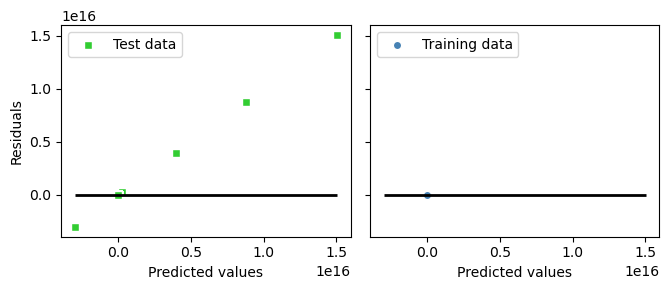

MAE train: 15876.40
MAE test: 143118844803183.84
R^2 train: 0.90
R^2 test: -249748636736789807104.00
R^2 scores: [-4.14595471e+18 -1.14729907e+19 -3.69994049e+19 -2.60504840e+17
 -2.87718040e+19]
Mean R^2: -1.633013182852947e+19
Standard deviation of R^2: 1.4228794467832248e+19


In [25]:
regression(LinearRegression())

### Logistic regression

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
The least populated class in y has only 1 members, which is less than n_splits=5.
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https

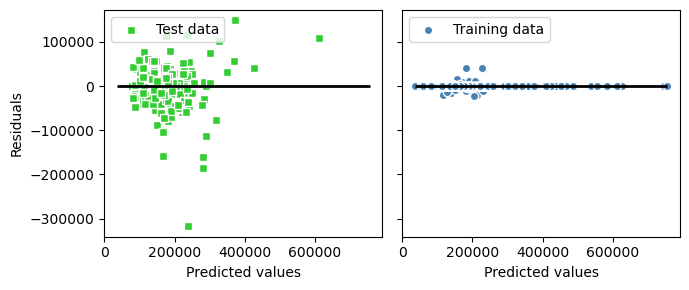

MAE train: 262.05
MAE test: 29711.63
R^2 train: 1.00
R^2 test: 0.64
R^2 scores: [0.61900725 0.45868757 0.67240869 0.6116943  0.56639056]
Mean R^2: 0.5856376743802783
Standard deviation of R^2: 0.07184492345871298


In [26]:
regression(LogisticRegression())

### Random forest regression

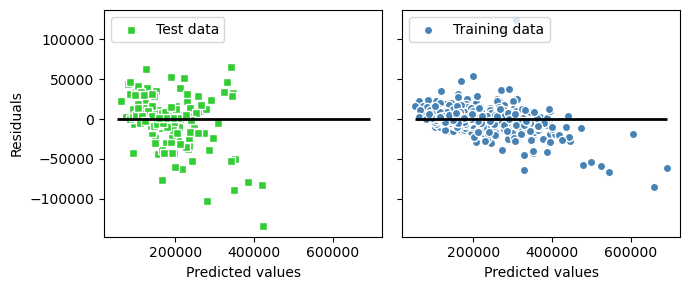

MAE train: 6440.28
MAE test: 16439.87
R^2 train: 0.98
R^2 test: 0.89
R^2 scores: [0.89044821 0.81362708 0.81142683 0.87967108 0.90393995]
Mean R^2: 0.8598226296899346
Standard deviation of R^2: 0.03938123189331612


In [27]:
regression(RandomForestRegressor(
    n_estimators=1000,
    criterion = 'squared_error',
    random_state = 1,
    n_jobs = 1
))

### Decision tree regression

The least populated class in y has only 1 members, which is less than n_splits=5.


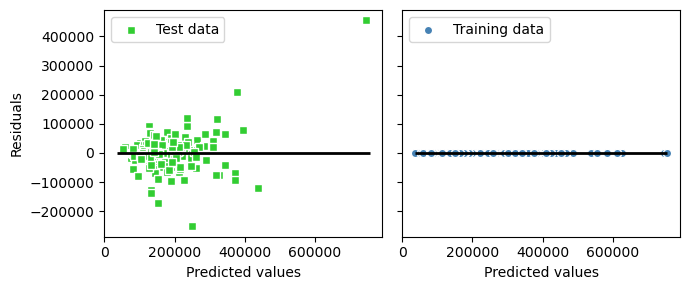

MAE train: 0.00
MAE test: 33236.79
R^2 train: 1.00
R^2 test: 0.49
R^2 scores: [0.54551247 0.47247242 0.64205919 0.49301651 0.44778785]
Mean R^2: 0.5201696895133457
Standard deviation of R^2: 0.0689213508380574


In [28]:
regression(DecisionTreeClassifier())

### SVM

The least populated class in y has only 1 members, which is less than n_splits=5.


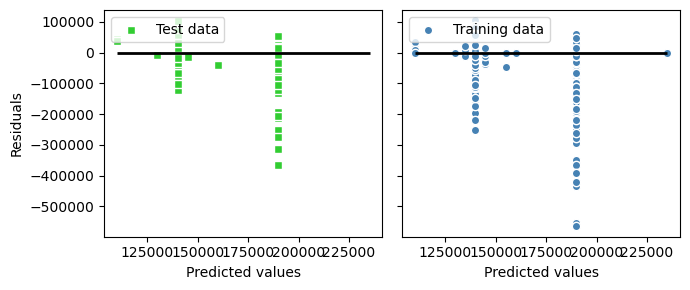

MAE train: 44176.79
MAE test: 43369.48
R^2 train: 0.20
R^2 test: 0.26
R^2 scores: [0.23076512 0.16399288 0.05299406 0.10346685 0.10085402]
Mean R^2: 0.13041458798340455
Standard deviation of R^2: 0.06130526188746276


In [29]:
regression(SVC())

### Neural network

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
The least populated class in y has only 1 members, which is less than n_splits=5.
Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.


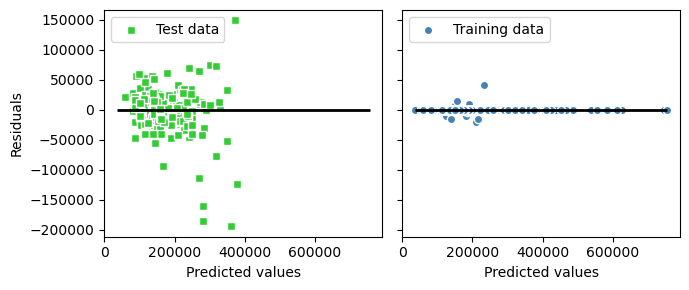

MAE train: 121.11
MAE test: 22463.01
R^2 train: 1.00
R^2 test: 0.78
R^2 scores: [0.76034703 0.59299015 0.7212219  0.73356577 0.68384409]
Mean R^2: 0.6983937894518
Standard deviation of R^2: 0.05816874636063506


In [30]:
regression(MLPClassifier())

### LDA

The least populated class in y has only 1 members, which is less than n_splits=5.


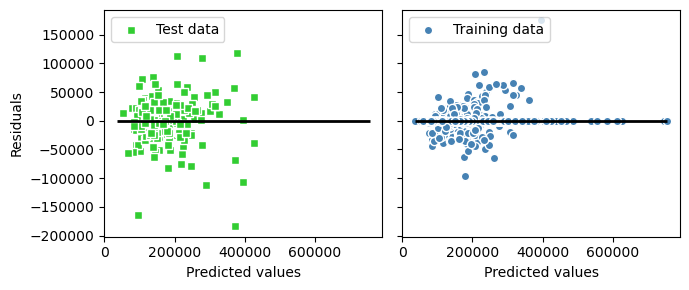

MAE train: 3972.84
MAE test: 25841.57
R^2 train: 0.98
R^2 test: 0.77
R^2 scores: [0.59314491 0.49252576 0.73331054 0.69409037 0.6864607 ]
Mean R^2: 0.6399064584595706
Standard deviation of R^2: 0.08687373418464872


In [31]:
regression(LinearDiscriminantAnalysis())

### KNN

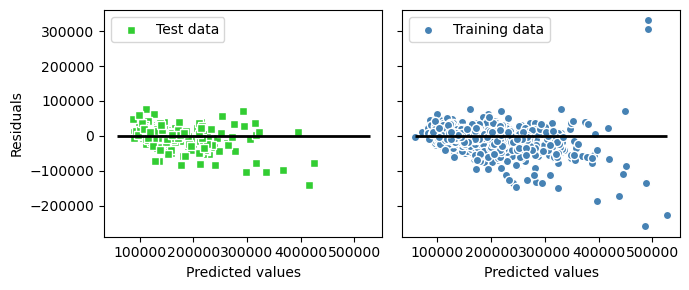

MAE train: 19284.65
MAE test: 21804.46
R^2 train: 0.84
R^2 test: 0.84
R^2 scores: [0.78193234 0.67101108 0.73400953 0.82534378 0.7888349 ]
Mean R^2: 0.7602263239792654
Standard deviation of R^2: 0.053247653722704215


In [32]:
regression(KNeighborsRegressor(n_neighbors=5) )

### LGBMRegressor

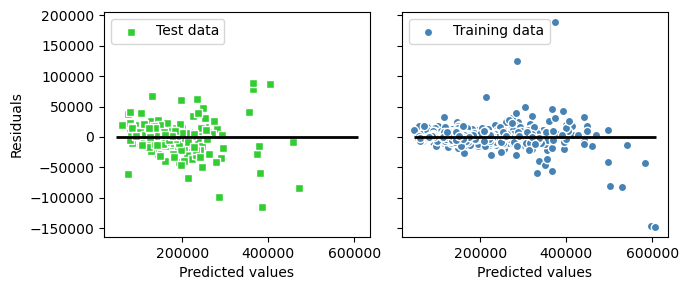

MAE train: 5939.28
MAE test: 16068.62
R^2 train: 0.98
R^2 test: 0.90
R^2 scores: [0.87663426 0.80311746 0.79082844 0.88893585 0.89531044]
Mean R^2: 0.8509652899257176
Standard deviation of R^2: 0.04466096212281546


In [33]:
regression(LGBMRegressor(verbose = -1))

## Tuning the most perspective models and choosing the best one

In [34]:
def tuning_model(regressor, param_grid):
    pipe = make_pipeline(final_transformer, regressor)

    # Inicjalizacja scorer'a dla R^2
    r2_scorer = make_scorer(r2_score)

    # Inicjalizacja GridSearchCV z użyciem R^2 jako metryki oceny
    grid_search = GridSearchCV(estimator=pipe,
                                param_grid=param_grid,
                                cv=3, 
                                scoring=r2_scorer)

    # Dopasowanie modelu do danych treningowych
    grid_search.fit(X_train, y_train)

    # Wyświetlenie najlepszych parametrów
    print("Najlepsze parametry:", grid_search.best_params_)

    # Wyświetlenie najlepszego osiągniętego wyniku
    print("Najlepszy wynik (R^2):", grid_search.best_score_)


#### Tuning neural networks

In [36]:
param_grid = {
    'mlpclassifier__hidden_layer_sizes': [(100,), (50, 50), (100, 50, 25)],
    'mlpclassifier__activation': ['relu', 'logistic'],
    'mlpclassifier__solver': ['sgd', 'adam'],
    'mlpclassifier__alpha': [0.0001, 0.01],
    'mlpclassifier__learning_rate': ['constant', 'adaptive'],
    'mlpclassifier__max_iter': [100000]
}
tuning_model(MLPClassifier(), param_grid)

The least populated class in y has only 1 members, which is less than n_splits=3.


Najlepsze parametry: {'mlpclassifier__activation': 'relu', 'mlpclassifier__alpha': 0.01, 'mlpclassifier__hidden_layer_sizes': (100, 50, 25), 'mlpclassifier__learning_rate': 'adaptive', 'mlpclassifier__max_iter': 100000, 'mlpclassifier__solver': 'sgd'}
Najlepszy wynik (R^2): 0.7742265979312227


#### Tuning LogisticRegression()

In [37]:
param_grid = {
    'logisticregression__penalty': ['l1', 'l2'],
    'logisticregression__C': np.logspace(-1, 1, 3),
    'logisticregression__solver': ['lbfgs', 'liblinear'],
    'logisticregression__max_iter': [500, 1000],
}
tuning_model(LogisticRegression(), param_grid)

The least populated class in y has only 1 members, which is less than n_splits=3.
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https

Najlepsze parametry: {'logisticregression__C': 1.0, 'logisticregression__max_iter': 500, 'logisticregression__penalty': 'l2', 'logisticregression__solver': 'lbfgs'}
Najlepszy wynik (R^2): 0.590747170754488


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


#### Tuning RandomForestRegressor()

In [38]:
param_grid = {
    'randomforestregressor__n_estimators': [100, 500, 1000],
    'randomforestregressor__max_features': ['sqrt', 'log2'],
    'randomforestregressor__max_depth': [None, 10, 50, 100],
    'randomforestregressor__min_samples_split': [2, 5, 10],
    'randomforestregressor__min_samples_leaf': [1, 2],
    'randomforestregressor__bootstrap': [True, False]
}
tuning_model(RandomForestRegressor(), param_grid)

Najlepsze parametry: {'randomforestregressor__bootstrap': False, 'randomforestregressor__max_depth': None, 'randomforestregressor__max_features': 'sqrt', 'randomforestregressor__min_samples_leaf': 1, 'randomforestregressor__min_samples_split': 2, 'randomforestregressor__n_estimators': 1000}
Najlepszy wynik (R^2): 0.8593067266473149


#### Tuning DecisionTreeRegressor()

In [39]:
param_grid = {
    'decisiontreeregressor__max_depth': [None, 10, 20, 30, 50, 70, 100],
    'decisiontreeregressor__min_samples_split': [2, 5, 10],
    'decisiontreeregressor__min_samples_leaf': [1, 2, 4],
    'decisiontreeregressor__max_features': ['sqrt', 'log2']
}
tuning_model(DecisionTreeRegressor(), param_grid)

Najlepsze parametry: {'decisiontreeregressor__max_depth': 100, 'decisiontreeregressor__max_features': 'sqrt', 'decisiontreeregressor__min_samples_leaf': 1, 'decisiontreeregressor__min_samples_split': 10}
Najlepszy wynik (R^2): 0.7001097108247034


#### Tuning LDA

In [40]:
param_grid = {
    'lineardiscriminantanalysis__solver': ['svd', 'lsqr', 'eigen'],
    'lineardiscriminantanalysis__tol': [1e-4, 1e-5, 1e-6],
    'lineardiscriminantanalysis__shrinkage': ['auto', None],
    'lineardiscriminantanalysis__n_components': [None, 1, 2, 3]
}
tuning_model(LinearDiscriminantAnalysis(), param_grid)

The least populated class in y has only 1 members, which is less than n_splits=3.
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to resh

Najlepsze parametry: {'lineardiscriminantanalysis__n_components': None, 'lineardiscriminantanalysis__shrinkage': 'auto', 'lineardiscriminantanalysis__solver': 'lsqr', 'lineardiscriminantanalysis__tol': 0.0001}
Najlepszy wynik (R^2): 0.7582525220954505


Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data array
Only one sample available. You may want to reshape your data a

#### Tuning KNN

In [41]:
param_grid = {
    'kneighborsregressor__n_neighbors': [5, 10, 15],
    'kneighborsregressor__weights': ['uniform', 'distance'],
    'kneighborsregressor__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'kneighborsregressor__leaf_size': [10, 30, 50],
    'kneighborsregressor__p': [1, 2]
}
tuning_model(KNeighborsRegressor(), param_grid)

Najlepsze parametry: {'kneighborsregressor__algorithm': 'auto', 'kneighborsregressor__leaf_size': 10, 'kneighborsregressor__n_neighbors': 5, 'kneighborsregressor__p': 1, 'kneighborsregressor__weights': 'distance'}
Najlepszy wynik (R^2): 0.7991402845832828


#### Tuning LGMRegressor()

In [42]:
param_grid = {
    'lgbmregressor__num_leaves': [10, 30, 50],
    'lgbmregressor__max_depth': [5, 15, 20],
    'lgbmregressor__learning_rate': [0.01, 0.05, 0.1],
    'lgbmregressor__n_estimators': [50, 100, 200],
    'lgbmregressor__reg_alpha': [0.0, 0.1, 0.5],
    'lgbmregressor__reg_lambda': [0.0, 0.1, 0.5],
}
tuning_model(LGBMRegressor(), param_grid)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002008 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2563
[LightGBM] [Info] Number of data points in the train set: 827, number of used features: 108
[LightGBM] [Info] Start training from score 182373.482467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000998 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 827, number of used features: 105
[LightGBM] [Info] Start training from score 180777.916566
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2498
[LightGBM] [Info] Number of data points in the t

We see LGMRegressor and RandomSearchForest give the best $R^2$ result. Let's estimate both models by these regressors.

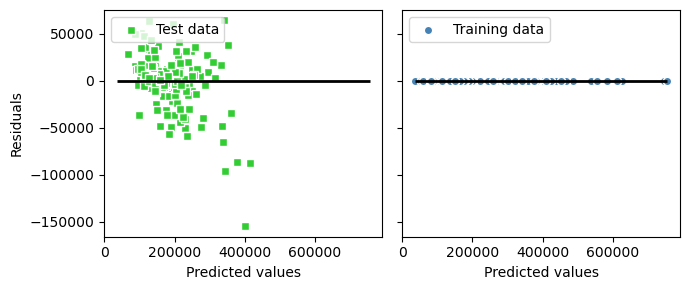

MAE train: 0.88
MAE test: 16455.64
R^2 train: 1.00
R^2 test: 0.89
R^2 scores: [0.90527729 0.8206955  0.81418861 0.88791984 0.89809107]
Mean R^2: 0.8652344619595793
Standard deviation of R^2: 0.03946393178398876


In [44]:
regression(RandomForestRegressor(
    bootstrap=False,
    max_depth=None,
    max_features='sqrt',
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=1000
))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002957 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2839
[LightGBM] [Info] Number of data points in the train set: 1241, number of used features: 121
[LightGBM] [Info] Start training from score 181762.525383
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2680
[LightGBM] [Info] Number of data points in the train set: 992, number of used features: 109
[LightGBM] [Info] Start training from score 183152.292339
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[Li

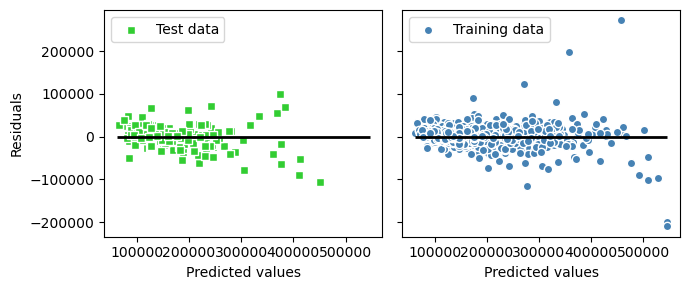

MAE train: 12616.56
MAE test: 16652.40
R^2 train: 0.93
R^2 test: 0.90
R^2 scores: [0.88718737 0.80105741 0.80941514 0.91217379 0.90458518]
Mean R^2: 0.8628837765971464
Standard deviation of R^2: 0.047834239691142984


In [45]:
regression(LGBMRegressor(
    learning_rate=0.1,
    max_depth=15,
    n_estimators = 50,
    num_leaves=10,
    reg_alpha=0.0,
    reg_lambda=0.1
))

RandomForestRegressor is slightly better than LGBMRegressor, so we use it to predict `sample_submission` values.

## Submission
Finally predict on the competition test data using the model.

In [48]:
test_data = pd.read_csv('test.csv')
ids = test_data.pop('Id')

test_ds = pd.DataFrame(final_transformer.transform(test_data), columns=final_transformer.get_feature_names_out())

best_decision_random_forest_regressor = RandomForestRegressor(bootstrap=False, 
                                                                max_depth=None,
                                                                max_features='sqrt',
                                                                min_samples_leaf=1,
                                                                min_samples_split=2,
                                                                n_estimators=1000)

# Dopasowanie modelu do danych treningowych
best_decision_random_forest_regressor.fit(X_train_processed, y_train)


# Oszacowanie przewidywanych wartości
predictions = best_decision_random_forest_regressor.predict(test_ds)


output = pd.DataFrame({'Id': ids,
                        'SalePrice': predictions.squeeze()})

output.head()

,Id,SalePrice
0,1461,125512.849
1,1462,149819.386
2,1463,184779.405
3,1464,188681.420
4,1465,191225.381
